# South Fork Eel River, CA, ROI#2 (north)

## Load *Streamlines* package

In [1]:
import streamlines

## Initiate *Streamlines* workflow

Choose the JSON parameters file we want to work with. The extension `.json` is automatically added.

In [2]:
JSON_parameters_file = 'SouthForkEelRiver3'

Initialize streamline analysis.

In [3]:
sl = streamlines.run( parameters_file=JSON_parameters_file, \
                        do_geodata = False, \
                        do_preprocess = False, \
                        do_condition=True, \
                        do_trace = False, \
                        do_analysis=False, \
                        do_mapping=False, \
                        do_plot=False, \
                        do_display=True, \
                        do_save=False )


Sat 2018-08-11 19:03:48 JST+0900

**Initialization begin**
Loaded JSON parameters file "/Users/colinstark/Work/Streamlines/slm/json/SouthForkEelRiver3.json"
slm git:
[['commit f74a16d68d646db442ad3e1cb3a001212cba02a9',
  'Author: Colin Stark',
  'Date:   Fri Jul 27 20:12:42 2018 +0900',
  '    Mostly implemented FMM measurement of HSL']]
slmnb git:
[['commit ccd1021bece27428fe55ca122aea285a89787f08',
  'Author: Colin Stark',
  'Date:   Tue Jun 26 20:06:54 2018 +0900',
  '    Self sync: Big "bug" fixes: ch mapping, ridges & masking, HSL distbn"']]
slmdata git:
[['commit ebec4d15fce4f5291086f119daf4b4e8f842d9fb',
  'Author: Colin Stark',
  'Date:   Mon May 14 19:27:53 2018 +0900',
  '    Add Ikawa ROI; replace Gabilan DTMs w pit filled']]
**Initialization end**



## Import DTM

In [4]:
sl.geodata.do()


**Geodata begin**
Reading DTM from GeoTIFF file "/Users/colinstark/Work/Streamlines/slmdata/SouthForkEelRiver/SouthForkEelRiver2_res2m_fillsinks0p01.tif"
(441482.3482, 2.0, 0.0, 4408462.1054, 0.0, -2.0)
DTM size: 3661 x 4213 = 15,423,793 pixels
DTM pixel size: 2.0m
DTM origin:
  - bottom-left pixel center: [441482.35mE, 4400036.11mN]
  - bottom-left pixel corner: [441481.35mE, 4400035.11mN]


ERROR 1: NUMPY driver was compiled against GDAL 2.2, but the current library version is 2.4


ROI pixel bounds:  [[0, 3660], [0, 4212]]
ROI pixel grid:  3661 x 4213 = 15,423,793 pixels
ROI pixel-edge boundaries (assuming pixel-as-area)
  - in pixel units: [x: 0.0<=>3661.0] , [y: 0.0<=>4213.0]
  - in meters:      [x: 0.0<=>7322.0] , [y: 0.0<=>8426.0]
Reading basins from GeoTIFF file "/Users/colinstark/Work/Streamlines/slmdata/SouthForkEelRiver/SouthForkEelRiver2_res2m_fillsinks0p01_basins.tif"
(441482.3482, 2.0, 0.0, 4408462.1054, 0.0, -2.0)
Mask out all but basin numbers [515]
**Geodata end**



Recording figure "roi_shaded_relief"


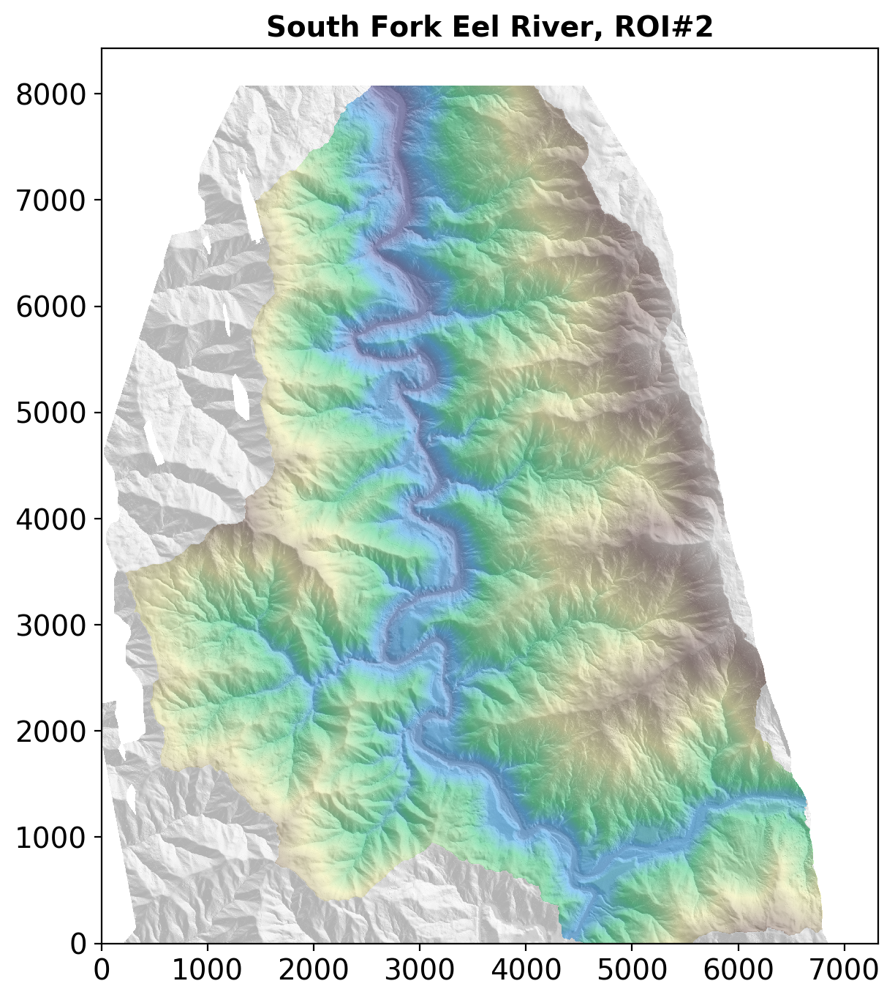

In [5]:
sl.plot.plot_roi_shaded_relief(interp_method='none')

## Preprocess DTM (fix loops etc)

In [6]:
sl.preprocess.do()


**Preprocess begin**
Precondition gradient vector field by fixing loops & blockages
Finding blockages...found 6157...done
Finding and fixing loops...
...done
Fixing blockages...
...done
Mask out bad uv pixels...done
**Preprocess end**



## Trace streamlines

In [7]:
%autosave 0
%time sl.trace.do()
%autosave 120

Autosave disabled

**Trace begin**
Integrating trajectories...
Generating seed points...shuffling...padding for 32 CL work items/group: 1000->1024...done
GPU/OpenCL device global memory limit for streamline trajectories: 3.6GB
GPU/OpenCL device memory required for streamline trajectories: 4MB => no need to chunkify
Total number of kernel instances: 1,024
Number of chunks = seed point array divisor: 1
Chunk size = number of kernel instances per chunk: 1,024
Downstream: downup=0 sgn(uv)=+1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Upstream:   downup=1 sgn(uv)=-1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Building streamlines compressed array
Streamlines actual array allocation:  size=2MB
Computing streamlines statistics
   downstream                            upstream                          
          min         mean          max       min         mean          max
l   52.163456   992.998

Autosaving every 120 seconds


In [8]:
import pandas as pd
ddf=pd.DataFrame(sl.trace.traj_stats_df.loc['downstream'].T)
udf=pd.DataFrame(sl.trace.traj_stats_df.loc['upstream'].T)
ddf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Downstreamline statistics:')
udf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Upstreamline statistics:')

,min,mean,max
l,52.2,993,1e+03
n,60,1.13e+03,1.14e+03
ds,0.869,0.88,0.886


,min,mean,max
l,7.48,803,1e+03
n,8,1.07e+03,2e+03
ds,0.0806,0.813,1


Autosave disabled
Plotting all 1,000 down streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%...53%...54%...55%...56%...57%...58%...59%...60%...61%...62%...63%...64%...65%...66%...67%...68%...69%...70%...71%...72%...73%...74%...75%...76%...77%...78%...79%...80%...81%...82%...83%...84%...85%...86%...87%...88%...89%...90%...91%...92%...93%...94%...95%...96%...97%...98%...99%...100%
Plotting all 1,000 up streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%..

Autosaving every 120 seconds


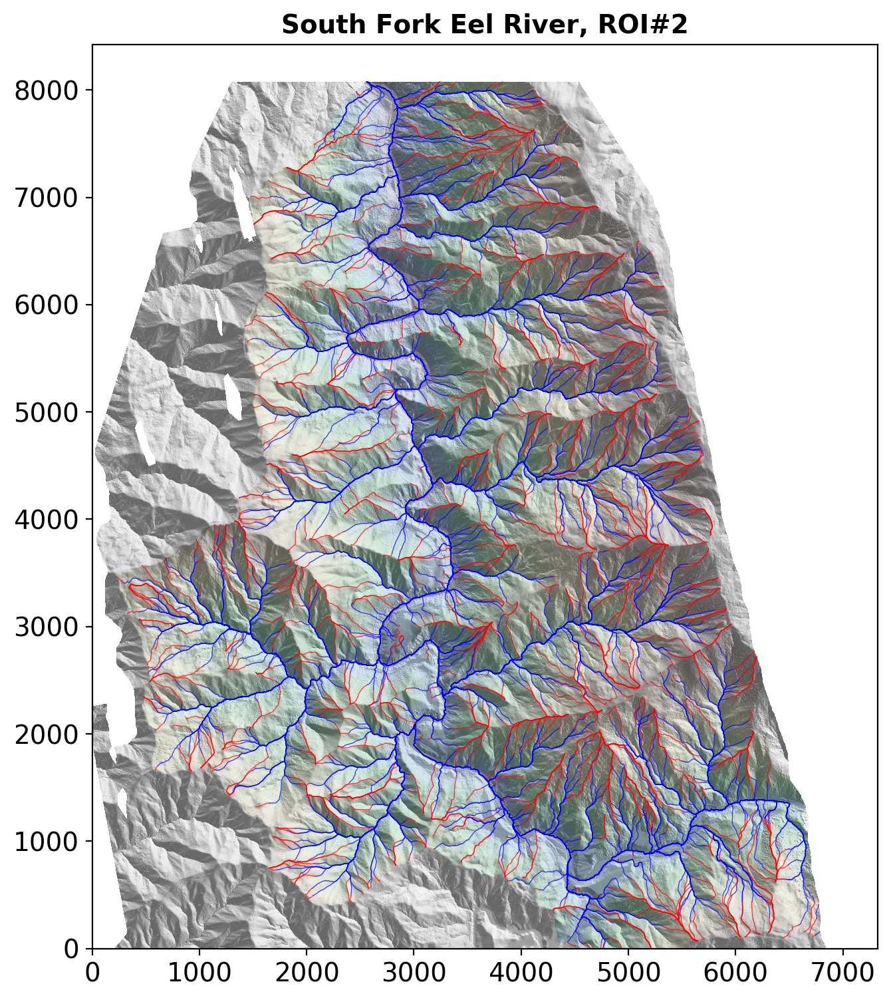

In [9]:
%autosave 0
sl.plot.plot_streamlines(window_size_factor=3)
%autosave 120

## Viz streamline flow concentrations

In [10]:
# sl.plot.plot_flow_maps(window_size_factor=3)

## Analyze streamline distributions

In [11]:
# sl.analysis.do()

In [12]:
# sl.plot.plot_distributions()

## Map channels, segments & hillslope lengths

In [13]:
sl.mapping.pass1()


**Pass#1 begin**
Channels...done
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Labeling confluences...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Segmenting channels...number of segments=410
...done
Linking hillslopes...
...done
Segmenting hillslopes...
...done
Subsegmenting left & right flanks...number of subsegments=819
...done
Prepare for mapping HSL from midslopes
Midslopes...done
Ridges...done
**Pass#1 end**


In [14]:
sl.mapping.pass2()


**Pass#2 begin**
0.0% -410 
Channel threshold = 114.4m
FMM mean HSL   = 54.9m
Trace mean HSL = 89.9m
0.1% -409 
Channel threshold = 95.4m
FMM mean HSL   = 78.8m
Trace mean HSL = 111.5m
0.2% -408 
Channel threshold = 65.4m
FMM mean HSL   = 48.8m
Trace mean HSL = 65.2m
0.4% -407 
Channel threshold = 115.0m
FMM mean HSL   = 80.9m
Trace mean HSL = 121.0m
0.5% -406 
Channel threshold = 50.1m
FMM mean HSL   = 37.0m
Trace mean HSL = 47.3m
0.6% -405 
Channel threshold = 202.4m
FMM mean HSL   = 53.5m
Trace mean HSL = 86.0m
0.7% -404 
Channel threshold = 128.9m
FMM mean HSL   = 62.9m
Trace mean HSL = 103.0m
0.9% -403 
Channel threshold = 84.4m
FMM mean HSL   = 58.1m
Trace mean HSL = 82.6m
1.0% -402 
Channel threshold = 102.9m
FMM mean HSL   = 74.5m
Trace mean HSL = 116.0m
1.1% -401 
Channel threshold = 288.5m
FMM mean HSL   = 87.5m
Trace mean HSL = 171.3m
1.2% -400 
Channel threshold = 97.4m
FMM mean HSL   = 47.4m
Trace mean HSL = 67.7m
1.3% -399 
Channel threshold = 348.0m
FMM mean HSL   = 83.

Trace mean HSL = 101.4m
12.0% -312 
Channel threshold = 60.3m
FMM mean HSL   = 57.4m
Trace mean HSL = 77.0m
12.1% -311 
Channel threshold = 159.3m
FMM mean HSL   = 92.9m
Trace mean HSL = 118.8m
12.2% -310 
Channel threshold = 162.6m
FMM mean HSL   = 63.0m
Trace mean HSL = 104.9m
12.3% -309 
Channel threshold = 269.2m
FMM mean HSL   = 39.0m
Trace mean HSL = 107.4m
12.5% -308 
Channel threshold = 109.6m
FMM mean HSL   = 54.6m
Trace mean HSL = 77.4m
12.6% -307 
Channel threshold = 49.2m
FMM mean HSL   = 53.1m
Trace mean HSL = 69.7m
12.7% -306 
Channel threshold = 86.8m
FMM mean HSL   = 61.9m
Trace mean HSL = 71.2m
12.8% -305 
Channel threshold = 75.8m
FMM mean HSL   = 54.6m
Trace mean HSL = 70.0m
13.0% -304 
Channel threshold = 58.9m
FMM mean HSL   = 46.0m
Trace mean HSL = 62.1m
13.1% -303 
Channel threshold = 100.9m
FMM mean HSL   = 66.8m
Trace mean HSL = 96.9m
13.2% -302 
Channel threshold = 259.3m
FMM mean HSL   = 112.8m
Trace mean HSL = 162.1m
13.3% -301 
Channel threshold = 141.2m
FM

FMM mean HSL   = 63.6m
Trace mean HSL = 102.8m
23.8% -214 
Channel threshold = 169.8m
FMM mean HSL   = 64.8m
Trace mean HSL = 78.0m
24.0% -213 
Channel threshold = 256.2m
FMM mean HSL   = 90.4m
Trace mean HSL = 161.5m
24.1% -212 
Channel threshold = 133.6m
FMM mean HSL   = 76.4m
Trace mean HSL = 98.4m
24.2% -211 
Channel threshold = 66.6m
FMM mean HSL   = 45.9m
Trace mean HSL = 63.2m
24.3% -210 
Channel threshold = 85.2m
FMM mean HSL   = 54.5m
Trace mean HSL = 71.7m
24.4% -209 
Channel threshold = 150.0m
FMM mean HSL   = 27.8m
Trace mean HSL = 36.7m
24.6% -208 
Channel threshold = 125.9m
FMM mean HSL   = 69.2m
Trace mean HSL = 99.3m
24.7% -207 
Channel threshold = 66.6m
FMM mean HSL   = 35.7m
Trace mean HSL = 48.6m
24.8% -206 
Channel threshold = 229.9m
FMM mean HSL   = 82.3m
Trace mean HSL = 121.1m
24.9% -205 
Channel threshold = 292.4m
FMM mean HSL   = 79.9m
Trace mean HSL = 122.4m
25.1% -204 
Channel threshold = 150.0m
FMM mean HSL   = 35.6m
Trace mean HSL = 48.0m
25.2% -203 
Channe

35.6% -117 
Channel threshold = 150.0m
FMM mean HSL   = 23.8m
Trace mean HSL = 32.0m
35.7% -116 
Channel threshold = 92.3m
FMM mean HSL   = 55.3m
Trace mean HSL = 91.3m
35.8% -115 
Channel threshold = 69.2m
FMM mean HSL   = 63.3m
Trace mean HSL = 66.8m
35.9% -114 
Channel threshold = 193.7m
FMM mean HSL   = 84.8m
Trace mean HSL = 122.5m
36.1% -113 
Channel threshold = 74.6m
FMM mean HSL   = 54.1m
Trace mean HSL = 84.9m
36.2% -112 
Channel threshold = 113.7m
FMM mean HSL   = 47.0m
Trace mean HSL = 69.0m
36.3% -111 
Channel threshold = 151.6m
FMM mean HSL   = 58.2m
Trace mean HSL = 113.6m
36.4% -110 
Channel threshold = 165.1m
FMM mean HSL   = 60.1m
Trace mean HSL = 84.8m
36.6% -109 
Channel threshold = 190.9m
FMM mean HSL   = 43.0m
Trace mean HSL = 64.2m
36.7% -108 
Channel threshold = 150.0m
FMM mean HSL   = 62.8m
Trace mean HSL = 117.1m
36.8% -107 
Channel threshold = 464.4m
FMM mean HSL   = 109.7m
Trace mean HSL = 239.4m
36.9% -106 
Channel threshold = 407.6m
FMM mean HSL   = 57.8m
T

FMM mean HSL   = 60.8m
Trace mean HSL = 82.4m
47.6% -19 
Channel threshold = 125.7m
FMM mean HSL   = 64.2m
Trace mean HSL = 90.7m
47.7% -18 
Channel threshold = 206.9m
FMM mean HSL   = 40.0m
Trace mean HSL = 81.4m
47.8% -17 
Channel threshold = 53.5m
FMM mean HSL   = 45.6m
Trace mean HSL = 59.0m
47.9% -16 
Channel threshold = 76.2m
FMM mean HSL   = 71.6m
Trace mean HSL = 91.0m
48.0% -15 
Channel threshold = 153.6m
FMM mean HSL   = 58.3m
Trace mean HSL = 105.2m
48.2% -14 
Channel threshold = 142.9m
FMM mean HSL   = 97.6m
Trace mean HSL = 130.7m
48.3% -13 
Channel threshold = 87.1m
FMM mean HSL   = 58.4m
Trace mean HSL = 87.9m
48.4% -12 
Channel threshold = 114.4m
FMM mean HSL   = 68.1m
Trace mean HSL = 97.1m
48.5% -11 
Channel threshold = 67.8m
FMM mean HSL   = 59.9m
Trace mean HSL = 76.2m
48.7% -10 
Channel threshold = 60.4m
FMM mean HSL   = 52.1m
Trace mean HSL = 64.7m
48.8% -9 
Channel threshold = 74.3m
FMM mean HSL   = 53.6m
Trace mean HSL = 69.2m
48.9% -8 
Channel threshold = 74.4m

Trace mean HSL = 33.0m
59.7% +81 
Channel threshold = 419.4m
FMM mean HSL   = 94.3m
Trace mean HSL = 156.5m
59.8% +82 
Channel threshold = 343.9m
FMM mean HSL   = 90.1m
Trace mean HSL = 181.6m
59.9% +83 
Channel threshold = 267.1m
FMM mean HSL   = 38.1m
Trace mean HSL = 61.7m
60.0% +84 
Channel threshold = 113.2m
FMM mean HSL   = 59.8m
Trace mean HSL = 85.8m
60.1% +85    --- (problem measuring HSL using FM)
60.3% +86 
Channel threshold = 120.8m
FMM mean HSL   = 71.7m
Trace mean HSL = 95.7m
60.4% +87 
Channel threshold = 201.1m
FMM mean HSL   = 41.0m
Trace mean HSL = 59.5m
60.5% +88 
Channel threshold = 231.0m
FMM mean HSL   = 36.3m
Trace mean HSL = 51.5m
60.6% +89 
Channel threshold = 769.7m
FMM mean HSL   = 24.1m
Trace mean HSL = 30.7m
60.8% +90 
Channel threshold = 152.9m
FMM mean HSL   = 50.1m
Trace mean HSL = 96.2m
60.9% +91 
Channel threshold = 629.0m
FMM mean HSL   = 15.0m
Trace mean HSL = 17.2m
61.0% +92 
Channel threshold = 124.9m
FMM mean HSL   = 45.6m
Trace mean HSL = 56.8m
6

71.5% +178 
Channel threshold = 319.6m
FMM mean HSL   = 58.7m
Trace mean HSL = 123.5m
71.6% +179 
Channel threshold = 309.1m
FMM mean HSL   = 8.0m
Trace mean HSL = 8.0m
71.8% +180 
Channel threshold = 394.6m
FMM mean HSL   = 24.9m
Trace mean HSL = 35.2m
71.9% +181 
Channel threshold = 247.5m
FMM mean HSL   = 46.6m
Trace mean HSL = 51.2m
72.0% +182 
Channel threshold = 225.5m
FMM mean HSL   = 44.9m
Trace mean HSL = 103.9m
72.1% +183 
Channel threshold = 457.5m
FMM mean HSL   = 35.0m
Trace mean HSL = 35.0m
72.2% +184 
Channel threshold = 148.1m
FMM mean HSL   = 76.7m
Trace mean HSL = 125.2m
72.4% +185 
Channel threshold = 67.6m
FMM mean HSL   = 61.7m
Trace mean HSL = 73.7m
72.5% +186 
Channel threshold = 212.0m
FMM mean HSL   = 63.7m
Trace mean HSL = 99.9m
72.6% +187 
Channel threshold = 115.4m
FMM mean HSL   = 26.0m
Trace mean HSL = 41.7m
72.7% +188 
Channel threshold = 150.0m
FMM mean HSL   = 6.0m
Trace mean HSL = 6.0m
72.9% +189 
Channel threshold = 343.4m
FMM mean HSL   = 25.6m
Trace

83.4% +275 
Channel threshold = 150.0m
FMM mean HSL   = 25.9m
Trace mean HSL = 30.9m
83.5% +276 
Channel threshold = 325.2m
FMM mean HSL   = 106.7m
Trace mean HSL = 167.0m
83.6% +277 
Channel threshold = 145.6m
FMM mean HSL   = 63.2m
Trace mean HSL = 87.7m
83.7% +278 
Channel threshold = 145.5m
FMM mean HSL   = 29.8m
Trace mean HSL = 36.4m
83.9% +279 
Channel threshold = 150.0m
FMM mean HSL   = 25.8m
Trace mean HSL = 30.4m
84.0% +280 
Channel threshold = 386.1m
FMM mean HSL   = 82.2m
Trace mean HSL = 117.9m
84.1% +281 
Channel threshold = 116.5m
FMM mean HSL   = 21.0m
Trace mean HSL = 21.0m
84.2% +282 
Channel threshold = 150.0m
FMM mean HSL   = 16.4m
Trace mean HSL = 18.3m
84.4% +283 
Channel threshold = 150.0m
FMM mean HSL   = 13.0m
Trace mean HSL = 13.0m
84.5% +284 
Channel threshold = 271.8m
FMM mean HSL   = 51.5m
Trace mean HSL = 98.6m
84.6% +285 
Channel threshold = 122.6m
FMM mean HSL   = 48.4m
Trace mean HSL = 82.9m
84.7% +286 
Channel threshold = 147.8m
FMM mean HSL   = 57.0m


95.2% +372 
Channel threshold = 127.1m
FMM mean HSL   = 37.8m
Trace mean HSL = 60.7m
95.4% +373 
Channel threshold = 258.9m
FMM mean HSL   = 20.9m
Trace mean HSL = 26.0m
95.5% +374 
Channel threshold = 150.4m
FMM mean HSL   = 35.1m
Trace mean HSL = 46.9m
95.6% +375 
Channel threshold = 83.9m
FMM mean HSL   = 63.8m
Trace mean HSL = 71.1m
95.7% +376 
Channel threshold = 220.1m
FMM mean HSL   = 77.2m
Trace mean HSL = 136.5m
95.8% +377 
Channel threshold = 86.7m
FMM mean HSL   = 48.5m
Trace mean HSL = 70.7m
96.0% +378 
Channel threshold = 145.4m
FMM mean HSL   = 92.8m
Trace mean HSL = 118.6m
96.1% +379 
Channel threshold = 91.5m
FMM mean HSL   = 64.4m
Trace mean HSL = 84.8m
96.2% +380 
Channel threshold = 138.5m
FMM mean HSL   = 38.8m
Trace mean HSL = 80.8m
96.3% +381 
Channel threshold = 139.0m
FMM mean HSL   = 57.7m
Trace mean HSL = 91.3m
96.5% +382 
Channel threshold = 239.8m
FMM mean HSL   = 67.3m
Trace mean HSL = 98.7m
96.6% +383 
Channel threshold = 278.8m
FMM mean HSL   = 60.2m
Trac

In [15]:
sl.mapping.hsl_mean_radius=50
sl.mapping.pass3()


**Pass#3 begin**
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Mapping hillslope lengths from midslopes...dilation with 51m (25-pixel) width filter...mean filtering with 100m (50-pixel) diameter disk...done
Computing hillslope aspect with median filter radii 4m (slope), 50m (uv)...done
Computing hillslope length-aspect function...done
Computing hillslope length-aspect statistics...done
**Pass#3 end**


## Viz channels & segments

Recording figure "channels"
Recording figure "label"


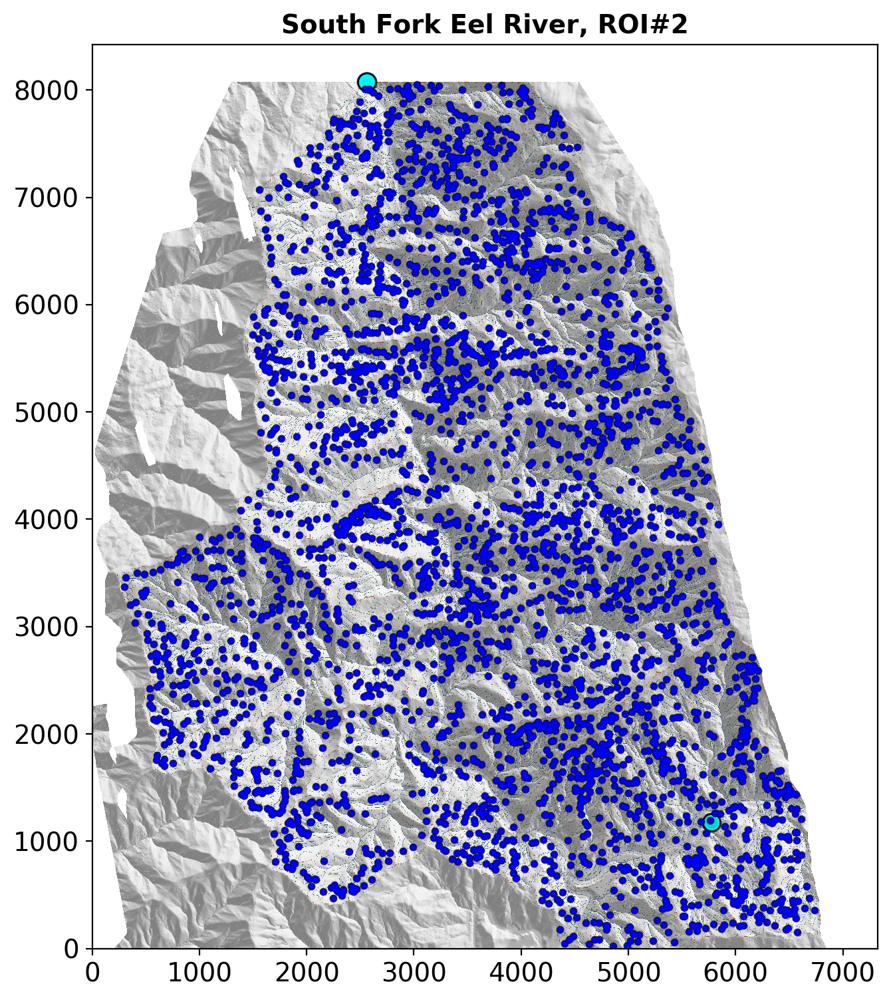

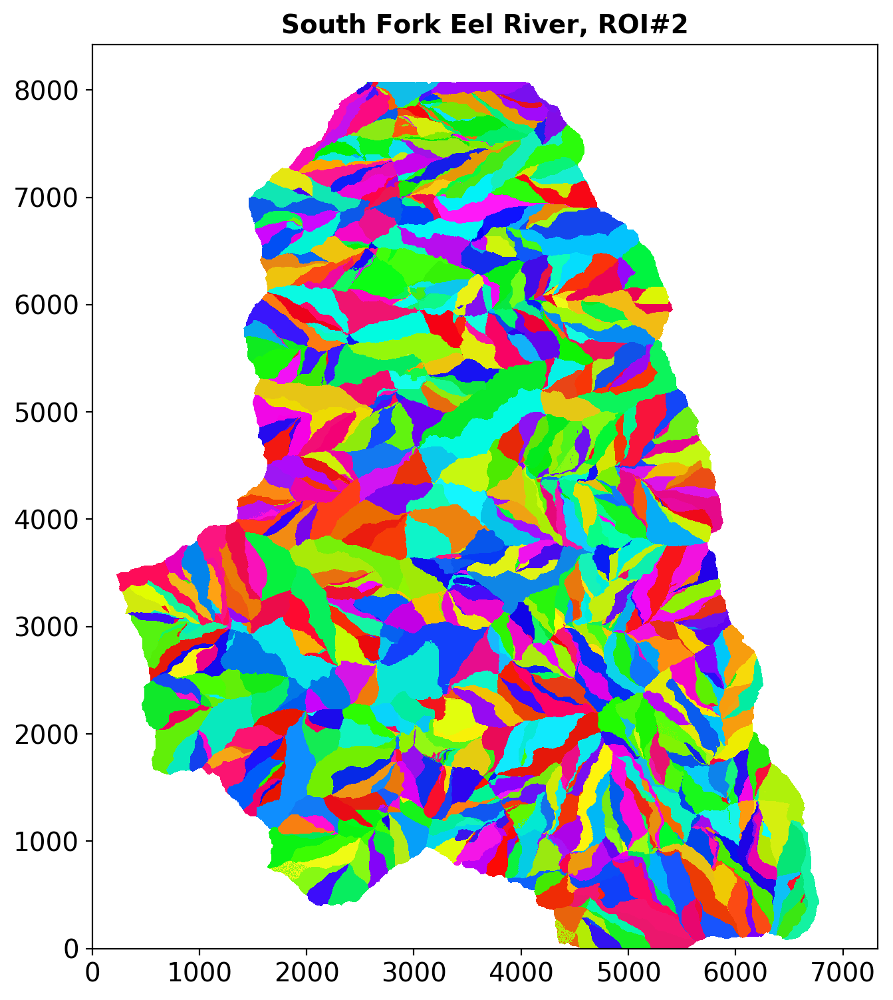

In [16]:
sl.plot.plot_channels(window_size_factor=3)
sl.plot.plot_segments(window_size_factor=3)

## Viz hillslope lengths

In [32]:
pctile=0.5
sl.plot.hsl_z_min=pctile
sl.plot.hsl_z_pctile=100-pctile
sl.plot.contour_hsl_z_min=pctile
sl.plot.contour_hsl_z_pctile=100-pctile

Recording figure "hsl"


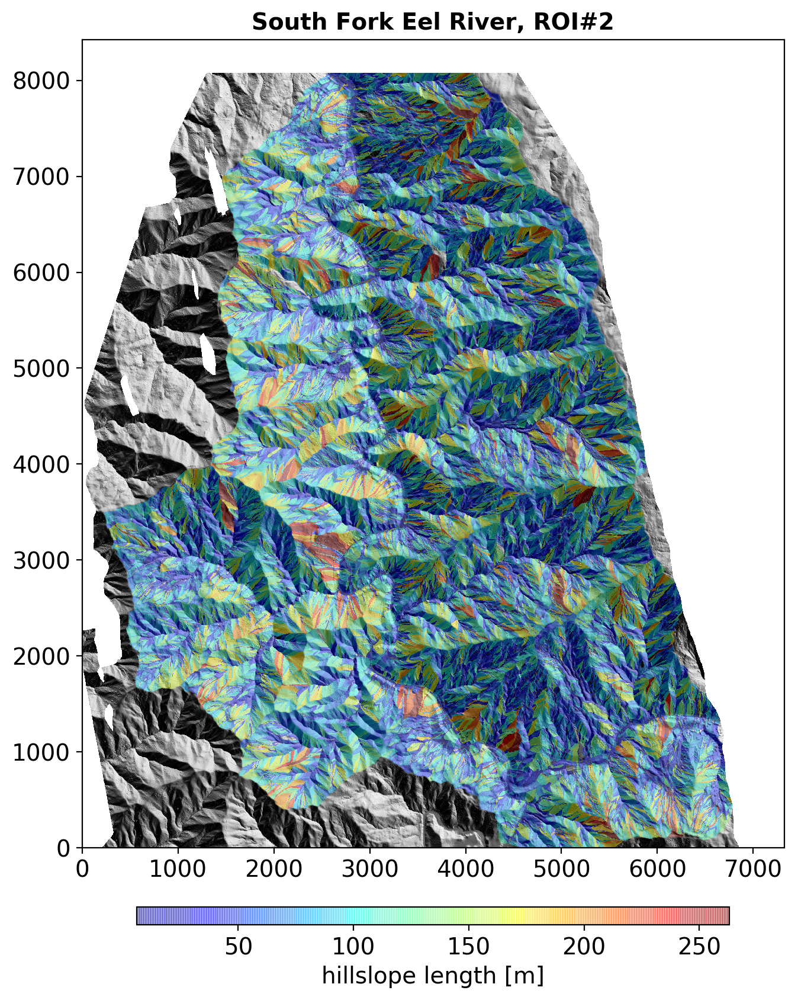

In [33]:
sl.plot.plot_hsl(window_size_factor=3.3)

Recording figure "hsl_contours"


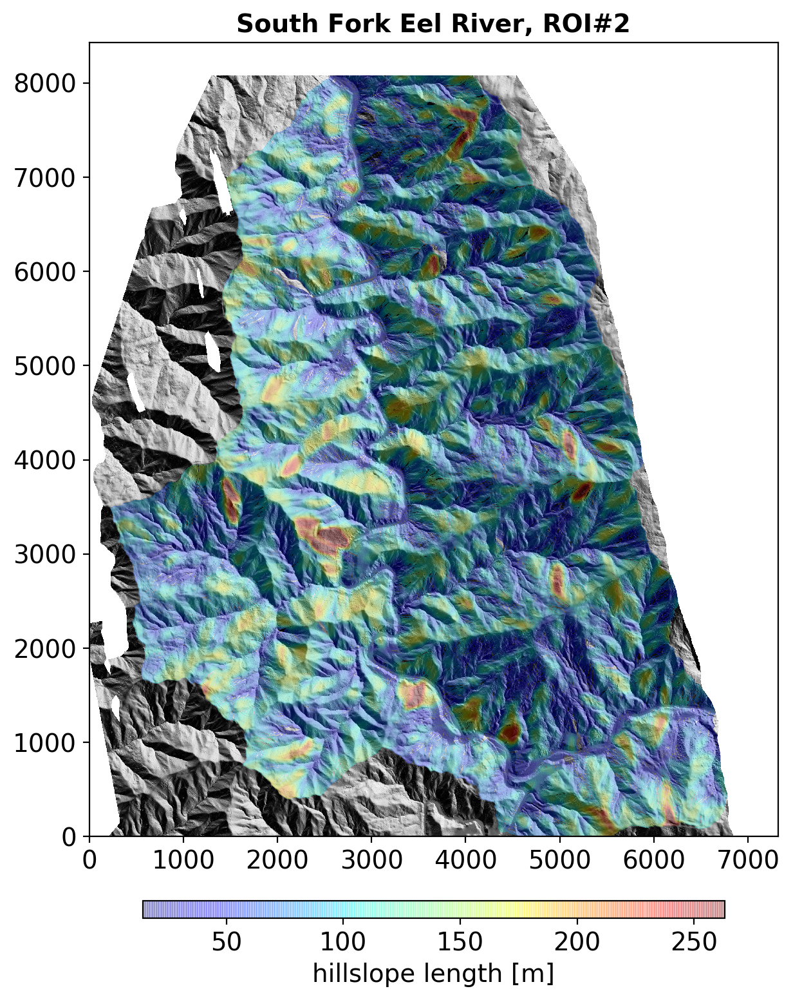

In [34]:
sl.plot.plot_hsl_contoured(window_size_factor=3)

## Viz aspect, hillslope length

Recording figure "aspect"


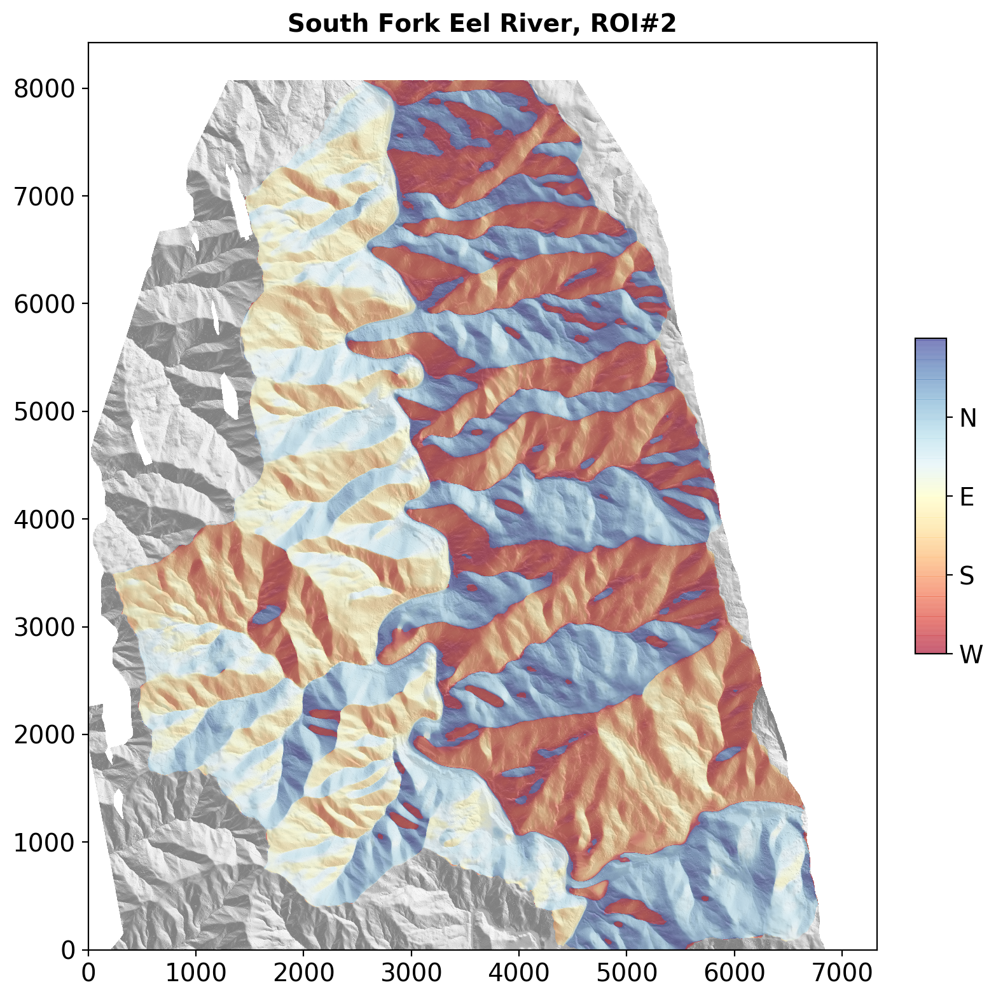

In [19]:
sl.plot.do_plot_aspect_contours=False
sl.plot.plot_aspect(window_size_factor=3.15)

In [20]:
sl.mapping.check_hsl_ns_disparity()

HSL mean ± σ(split), σ(all):	      97.7m ± 4.2m (split) 5.8m (all)
HSL N-S disparity:		      100.5mN vs 94.9mS   ∆≈5.6m
HSL N-S rel disparity vs variation:   5.7% (5.6m) NS vs 4.3% (4.2m)
HSL N-S disparity signal-noise ratio: ∆/σ = 1.3
					=> moderate north bias
N-facing vs S-facing HSL distribution comparison tests
  for f(HSL_N,S) with N,S bounds 45°<|±aspect|<135° from east
D_alpha =  c(alpha)*0.00775024
Kolmogorov-Smirnov: 0.04 p=1.06254e-29
Mann-Whitney:       0.47 p=2.88446e-48
Rank-sum:           14.6 p=5.7689e-48
Student's t:        15.1 p=1.11435e-51
Welch:              15.1 p=9.93253e-52
P-P:                +19%


Recording figure "hsl_aspect_distribution"


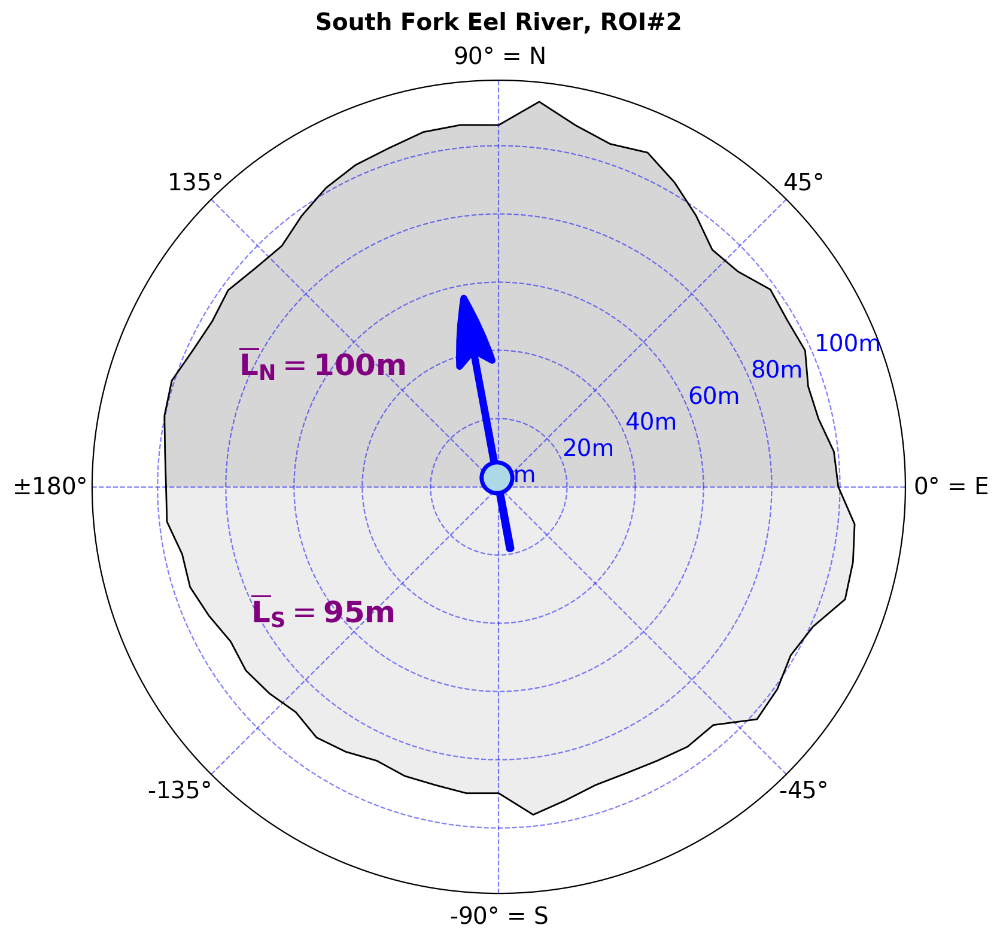

In [21]:
sl.plot.plot_hsl_aspect_distribution(window_size_factor=3)

## Hillslope length stats

Plotting hillslope length distributions...
Recording figure "hsl_nsall_distbn"
Recording figure "hsl_ns_qq"
Recording figure "hsl_ns_pp"


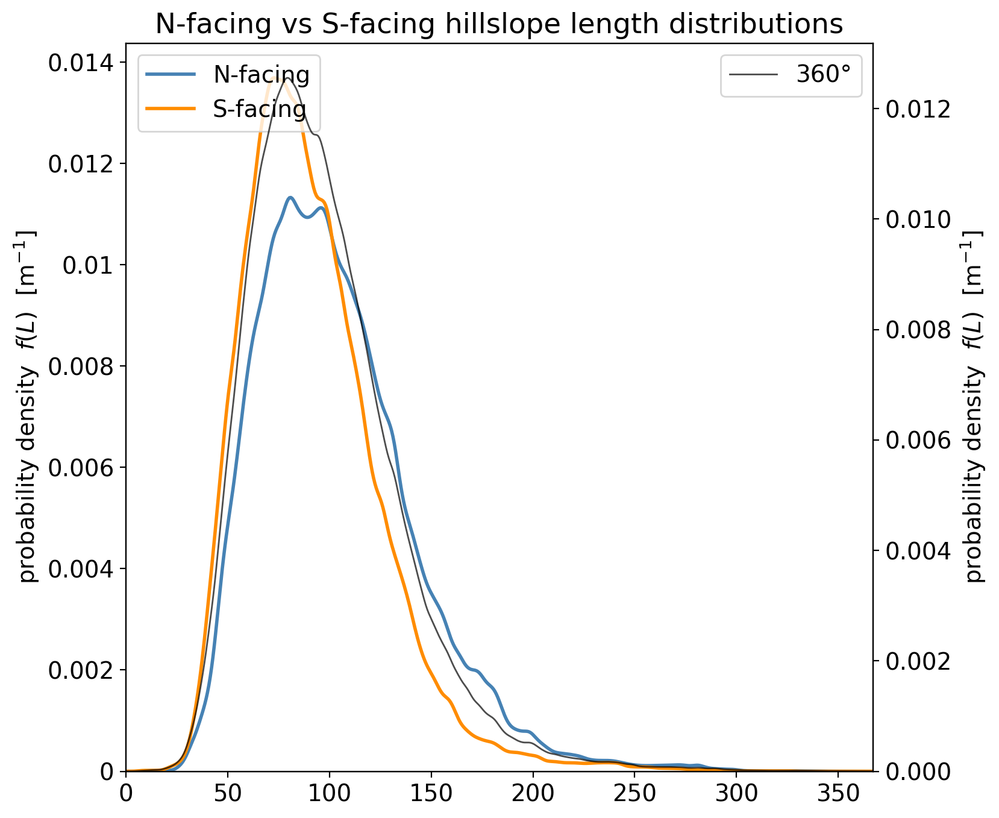

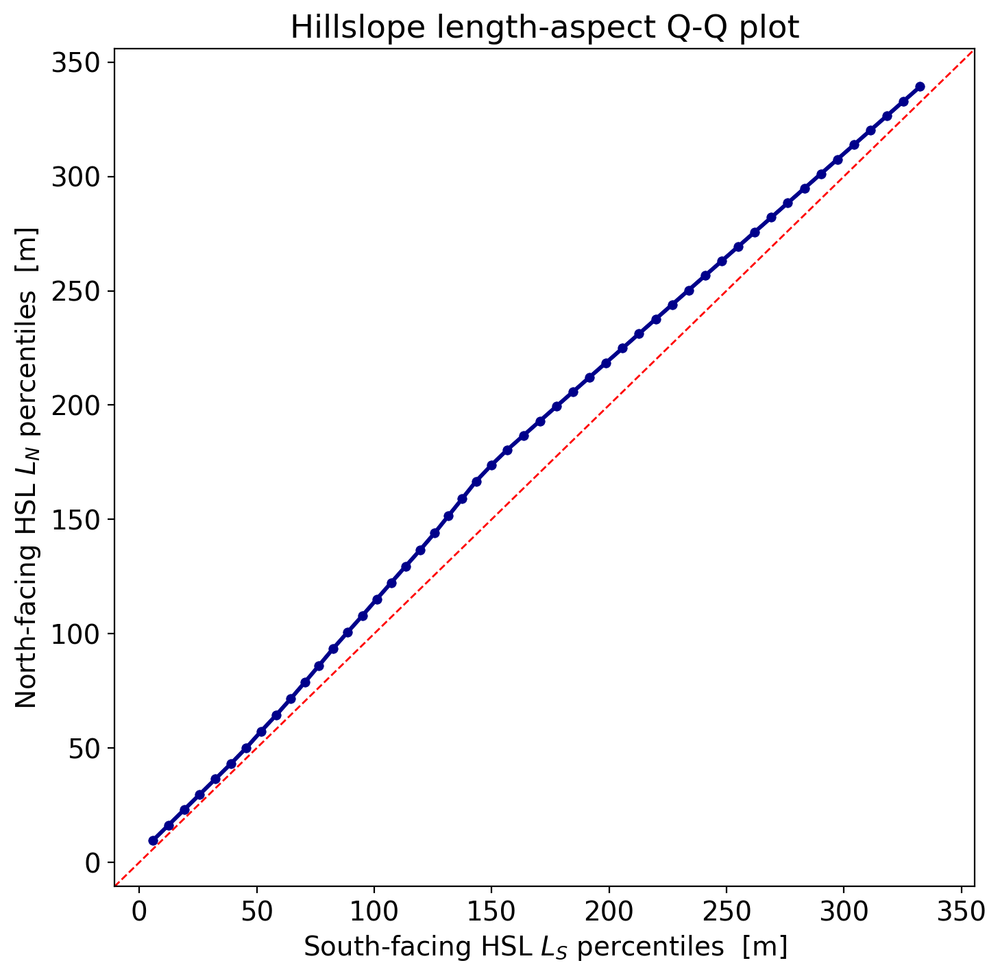

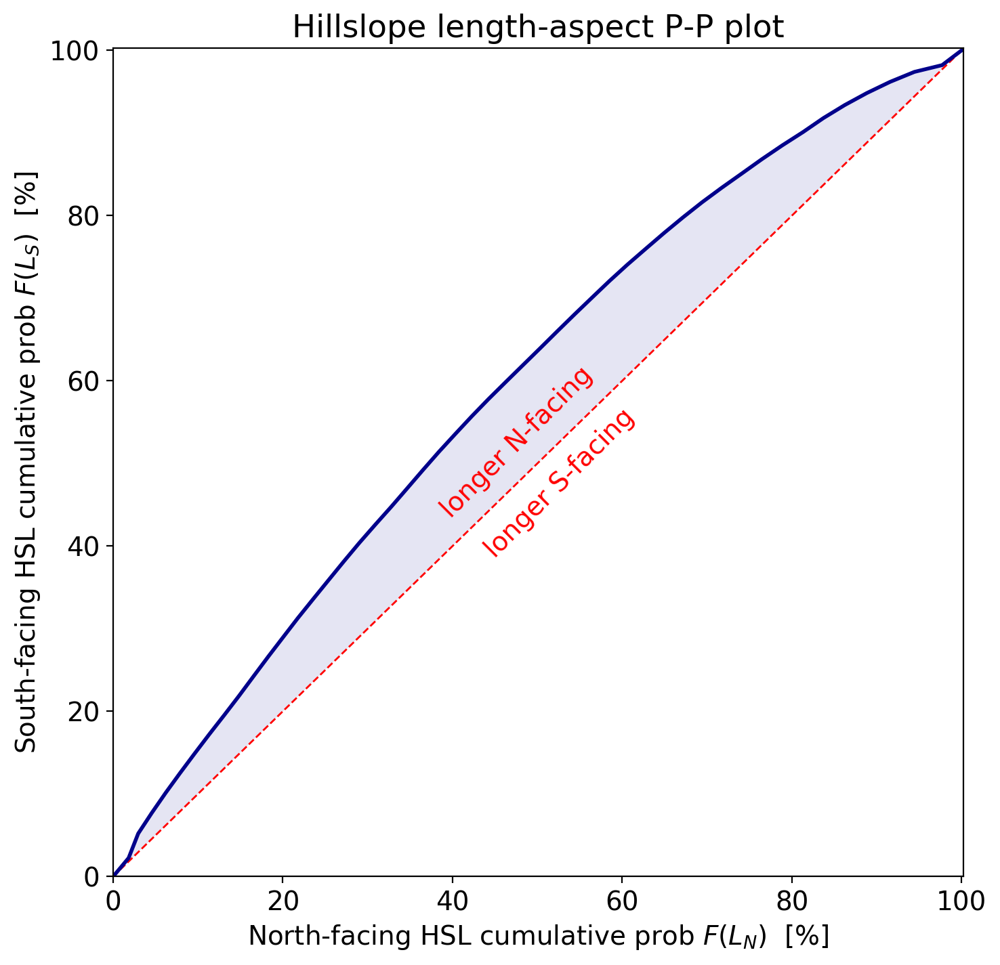

In [22]:
sl.plot.plot_hsl_distributions()

In [23]:
df = sl.mapping.hsl_stats_df
df[:30].style.format("{:.3g}").set_properties(**{'font-size':'140%'}) \
         .set_caption('Hillslope length statistics:')
df.mean()

,,count,mean [m],stddev [m]
fine,coarse,,,


count        NaN
mean [m]     NaN
stddev [m]   NaN
dtype: float64

## Export plots

In [24]:
sl.plot.figs

{'roi_shaded_relief': <Figure size 810x810 with 1 Axes>,
 'streamlines': <Figure size 900x900 with 1 Axes>,
 'channels': <Figure size 900x900 with 1 Axes>,
 'label': <Figure size 900x900 with 1 Axes>,
 'hsl': <Figure size 990x990 with 2 Axes>,
 'hsl_contours': <Figure size 900x900 with 2 Axes>,
 'aspect': <Figure size 945x945 with 2 Axes>,
 'hsl_aspect_distribution': <Figure size 900x900 with 1 Axes>,
 'hsl_nsall_distbn': <Figure size 800x800 with 2 Axes>,
 'hsl_ns_qq': <Figure size 810x810 with 1 Axes>,
 'hsl_ns_pp': <Figure size 810x810 with 1 Axes>}

In [25]:
sl.save.do()


**Write results to files begin**
Saving maps...
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_dtm_mask.tif (3665, 4217)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_basin_mask.tif (3665, 4217)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_uv.tif (3665, 4217, 2)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_slope.tif (3665, 4217)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_mapping.tif (3665, 4217)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_coarse_subsegment.tif (3665, 4217)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_merged_coarse_mask.tif (3665, 4217)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_hsl.tif (3665, 4217)
/Users/colinstark/Work/Streamlines/slmxpt/SouthForkEelRiver3/SouthForkEelRiver3_hsl_smoothed.t